# Детекция масок (YOLOv8)

## Импорт библиотек

In [1]:
!pip install ultralytics

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.2.31 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 30.2/78.2 GB disk)


In [3]:
# Для загрузки и анализа данных
import os
import glob
import pandas as pd
import numpy as np
import xml.etree.ElementTree as ET
from tqdm import tqdm
from sklearn import preprocessing
from sklearn import model_selection
from sklearn import metrics

# Для работы с изображениями и построения модели
import torch
import cv2
import shutil
# !pip install squarify
import squarify
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
%matplotlib inline

## Загрузка данных

Сперва скачаем данные из Kaggle (nb запускается в gc).

In [4]:
# !pip install -q kaggle
# !mkdir ~/.kaggle
# !cp kaggle.json ~/.kaggle/
# !chmod 600 /root/.kaggle/kaggle.json
# !kaggle datasets download -d andrewmvd/face-mask-detection
# !unzip face-mask-detection.zip

In [5]:
# Путь до папки с аннотациями
ANNOTATIONS_PATH = "/content/annotations"
# Путь до папки с изображениями
IMAGES_PATH = "/content/images"

# Функция для парсинга xml-файлов
def xml_to_csv(path = ANNOTATIONS_PATH):
    xml_list = []
    for xml_file in tqdm(glob.glob(path + '/*.xml')):
        tree = ET.parse(xml_file)
        root = tree.getroot()
        for obj in root.findall('object'):
            bbx = obj.find('bndbox')
            size = root.find('size')
            width = int(size.find('width').text)
            height = int(size.find('height').text)
            xmin = int(bbx.find('xmin').text)
            ymin = int(bbx.find('ymin').text)
            xmax = int(bbx.find('xmax').text)
            ymax = int(bbx.find('ymax').text)
            name = obj.find('name').text

            value = (root.find('filename').text,
                     width, height, name,
                     xmin, ymin, xmax, ymax
                     )
            xml_list.append(value)
    column_name = ['filename', 'width', 'height',
                   'name', 'xmin', 'ymin', 'xmax', 'ymax']
    xml_df = pd.DataFrame(xml_list, columns=column_name)
    return xml_df

In [6]:
xml_df = xml_to_csv()
print('Конвертация прошла успешно.')

100%|██████████| 853/853 [00:00<00:00, 1974.40it/s]

Конвертация прошла успешно.


In [7]:
xml_df.head()

,filename,width,height,name,xmin,ymin,xmax,ymax
0,maksssksksss577.png,400,267,with_mask,106,61,117,72
1,maksssksksss577.png,400,267,without_mask,137,67,152,80
2,maksssksksss577.png,400,267,with_mask,188,55,203,72
3,maksssksksss577.png,400,267,with_mask,237,70,256,88
4,maksssksksss577.png,400,267,with_mask,279,79,297,97


In [8]:
print(f'Количество записей об объектах {xml_df.shape[0]}')
print(f'Количество изображений в датафрэйме {len(np.unique(xml_df["filename"]))}')

Количество записей об объектах 4072
Количество изображений в датафрэйме 853


## Обработка данных

Далее из-за выходящих за пределы изображения bbox-ов могут возникнуть ошибки, поэтому мы вручную пофиксим такие случаи.

In [9]:
xml_df.query("width < xmax")

,filename,width,height,name,xmin,ymin,xmax,ymax
359,maksssksksss231.png,400,249,with_mask,392,86,401,106
380,maksssksksss787.png,400,288,with_mask,360,79,401,139
1279,maksssksksss457.png,400,300,with_mask,389,56,401,83
1463,maksssksksss110.png,400,267,without_mask,381,14,401,34
1494,maksssksksss616.png,400,267,with_mask,394,92,401,111
1903,maksssksksss501.png,400,255,with_mask,357,65,401,132
2059,maksssksksss5.png,400,266,without_mask,364,30,401,66
2451,maksssksksss93.png,400,267,with_mask,388,72,401,92
2672,maksssksksss603.png,400,278,with_mask,397,132,401,142
2688,maksssksksss603.png,400,278,without_mask,396,18,401,23


Просто уменьшим на единицу вылезающие xmax-ы.

In [10]:
xml_df.loc[xml_df['xmax'] > xml_df['width'], 'xmax'] -= 1

Закодируем классы обьектов.

In [11]:
le = preprocessing.LabelEncoder()
xml_df['class'] = le.fit_transform(xml_df['name'])

xml_df.head()

,filename,width,height,name,xmin,ymin,xmax,ymax,class
0,maksssksksss577.png,400,267,with_mask,106,61,117,72,1
1,maksssksksss577.png,400,267,without_mask,137,67,152,80,2
2,maksssksksss577.png,400,267,with_mask,188,55,203,72,1
3,maksssksksss577.png,400,267,with_mask,237,70,256,88,1
4,maksssksksss577.png,400,267,with_mask,279,79,297,97,1


In [12]:
print('Распределение классов:')
xml_df.name.value_counts()

Распределение классов:


name
with_mask                3232
without_mask              717
mask_weared_incorrect     123
Name: count, dtype: int64

Сохраним кодировку классов в словаре.

In [13]:
labels_dict = dict(zip(range(len(le.classes_)), le.classes_))

labels_dict

{0: 'mask_weared_incorrect', 1: 'with_mask', 2: 'without_mask'}

## Сплитование данных

Разделим данные на выборки, расчитав обратный вес классов и усреднив их веса в пределах своих изображений.

In [14]:
# Подготовим словарь обратных весов
val_cnts_dct = dict(xml_df.name.value_counts())
wdict = {k: 1 - v / xml_df.shape[0] for k, v in val_cnts_dct.items()}
wdict

{'with_mask': 0.20628683693516703,
 'without_mask': 0.8239194499017681,
 'mask_weared_incorrect': 0.9697937131630648}

Теперь нам нужно создать соответствующий столбец с весами объектов. Затем, сгруппировав данные по изображениям, мы усредним веса среди объектов, принадлежащих одному и тому же изображению.

In [15]:
xml_df['weight'] = xml_df['name'].replace(wdict)
xml_df['weight'] = (
    xml_df.groupby('filename')['weight'].transform('mean')
)

Создаем признак весовых категорий и делим данные на соответствующие части в каждой из них.

In [19]:
xml_df['w_cat'] = (
    xml_df['weight'].astype(str).apply(
        lambda x: x[:3]
    )
)

unique_imgs_and_ctgs = xml_df[['filename', 'w_cat']].drop_duplicates()
train, valid = model_selection.train_test_split(
    unique_imgs_and_ctgs, train_size=0.8,
    stratify=unique_imgs_and_ctgs['w_cat'],
    random_state=1
)

train_df = (
    xml_df[xml_df['filename'].isin(train['filename'])].copy()
)

valid_df = (
    xml_df[xml_df['filename'].isin(valid['filename'])].copy()
)

print('Train:')
print(f"Число изображений: {train_df['filename'].nunique()}")
print(f"Число объектов:    {train_df.shape[0]}\n---")
print('Valid:')
print(f"Число изображений: {valid_df['filename'].nunique()}")
print(f"Число объектов:    {valid_df.shape[0]}\n")

Train:
Число изображений: 682
Число объектов:    3376
---
Valid:
Число изображений: 171
Число объектов:    696



In [20]:
# Сохраним таблицы
train_df.to_csv('train_df.csv', index=None)
valid_df.to_csv('valid_df.csv', index=None)

Визуализиурем соотношение классов для наглядности

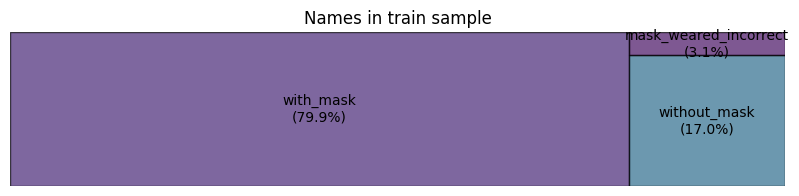

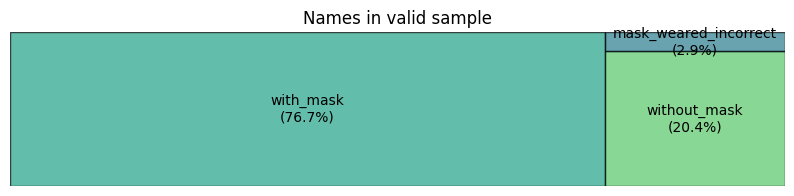

In [21]:
# Получаем распределение значений столбца 'name' с нормализацией
train_names_vls_cnts = train_df['name'].value_counts(normalize=True)
valid_names_vls_cnts = valid_df['name'].value_counts(normalize=True)

# Функция для получения иерархической диаграммы
def get_hierarchical_diagram(vls_cnts, sample='train'):
    plt.figure(figsize=(10, 2))
    squarify.plot(
        sizes=vls_cnts,
        label=[f'{label}\n({value:.1%})' for label, value in zip(
            vls_cnts.index, vls_cnts
            )],
        alpha=0.7, edgecolor='black')
    plt.axis('off')
    plt.title(f'Names in {sample} sample')
    plt.show()

for vls_cnts, sample_name in [
    (train_names_vls_cnts, 'train'), (valid_names_vls_cnts, 'valid')
    ]:
    get_hierarchical_diagram(vls_cnts, sample=sample_name)

Можно немного поиграться с random_state сплиттера, чтобы представительство классов в выборках не сильно отличалось.

 ## Визуализация данных

 Напишем функцию для визуализации. Функция будет принимать название файла с нужным изображением и DataFrame с координатами и выводить изображение на экран.

In [22]:
def plot_bounding_box(image_folder, image_filename, df=xml_df):
    # Создаем полный путь до изображения
    image_path = os.path.join(image_folder, image_filename)
    # Читаем изображение
    img = plt.imread(image_path)
    # Создаем фигуру и координатную плоскость
    fig, ax = plt.subplots(figsize=(8, 6))
    # Выводим изображение на экран
    ax.imshow(img);

    # Находим индекс картинки в DataFrame
    image_idx = df[df['filename'] == image_filename].index

    # Так как боксов может быть несколько, создаем цикл по всем ним
    for i in range(len(image_idx)):
        # Находим координаты левой нижней точки
        x_min = df.loc[image_idx[i], 'xmin']
        y_min = df.loc[image_idx[i], 'ymin']
        # Находим ширину и высоту рамки
        box_width = df.loc[image_idx[i], 'xmax'] - df.loc[image_idx[i], 'xmin']
        box_height = df.loc[image_idx[i], 'ymax'] - df.loc[image_idx[i], 'ymin']
        name = df.loc[image_idx[i], 'name']
        # Строим прямоугольник
        rect = patches.Rectangle(
            (x_min, y_min),  # Координаты опорной точки
            box_width,  # Ширина прямоугольника
            box_height,  # Высота прямоугольника
            linewidth=1.5,  # Ширина линии
            edgecolor=(0, 1, 0),  # Цвет
            facecolor='none'  # Заливка (none - отсутствует)
        )
        # Добавляем прямоугольник на изображение
        ax.add_patch(rect)
        # Находим ширину и высоту текста
        ((text_width, text_height), _) = cv2.getTextSize(
            name, cv2.FONT_HERSHEY_SIMPLEX, 0.35, 1
            )
        # Строим рамку текста
        text_rect = patches.Rectangle(
            (x_min - 0.5, y_min - int(1.3 * text_height) - 2),
            text_width*0.85,
            text_height * 1.5,
            linewidth=0,
            edgecolor=(0, 1, 0),
            facecolor=(0, 1, 0)
        )
        # Добавляем рамку текста
        ax.add_patch(text_rect)

        # Добавляем текстовую метку (name) к прямоугольнику
        ax.text(
            x_min + 1, y_min - 2,
            name, color='w', fontsize=10
        )

    plt.show()

maksssksksss717.png


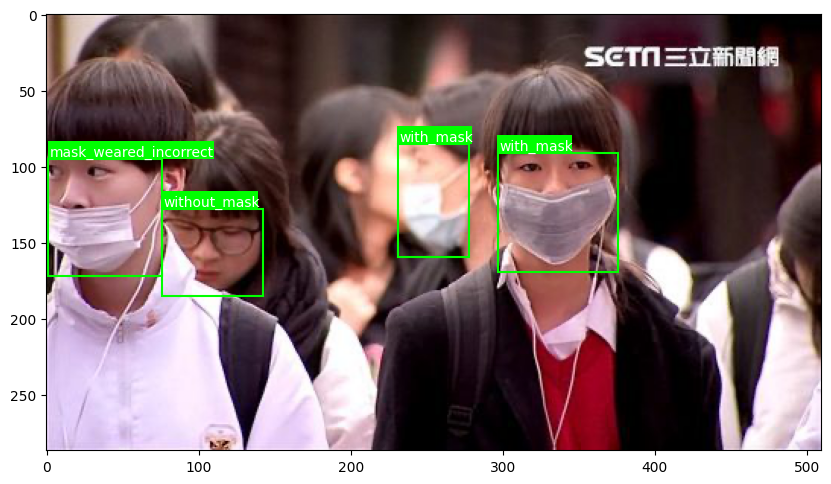

In [ ]:
# Выберем рандомное фото и выведем его с рамками
random_image_filename = np.random.choice(xml_df.filename.unique())
print(random_image_filename)
plot_bounding_box(IMAGES_PATH, random_image_filename)

## Испытание предобученной модели

Обученная модель находится в классе hub библиотеки `torch`.

Посмотрим на предсказания модели для изображения из наших данных.

100%|██████████| 49.7M/49.7M [00:00<00:00, 288MB/s]



image 1/1 /content/images/maksssksksss0.png: 480x640 5 persons, 1 backpack, 4 handbags, 1 cell phone, 86.9ms
Speed: 14.1ms preprocess, 86.9ms inference, 832.2ms postprocess per image at shape (1, 3, 480, 640)


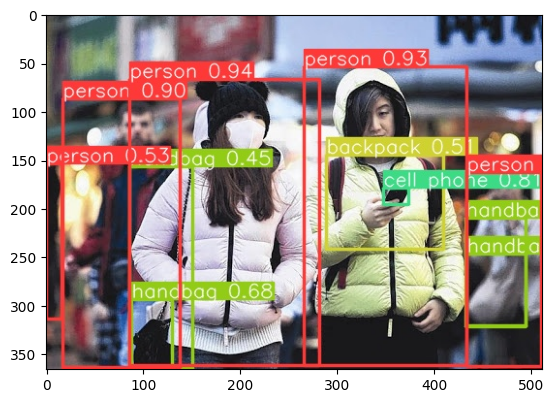

In [23]:
# Загрузка модели
model = ultralytics.YOLO("yolov8m.pt")

# Задаем путь до изображения
source = "/content/images/maksssksksss0.png"

# Запуск модели
results = model(source)  # получаем список результатов
# Сохраним результат в виде картинки
for i, r in enumerate(results):
    r.save(filename=f"results{i}.jpg")
# Визуализация
plt.imshow(plt.imread('/content/results0.jpg'));

Разумеется, модель еще не умеет искать то, что нам нужно, однако общее умение детектировать объекты уже удивляет.

## Формируем датасет

Мы будем обучать модель **yolov8**. Для данной модели изображения и классы объектов должны находиться в папках images и labels, соответсвенно.

Перейдем к созданию директорий. Зададим пути в виде глобальных переменных:

In [24]:
DATA_PATH = "dataset/"

LABELS_PATH = os.path.join(DATA_PATH, "labels")
IMGS_PATH = os.path.join(DATA_PATH, "images")

TRAIN_IMAGES_PATH = os.path.join(IMGS_PATH, "train")
VAL_IMAGES_PATH = os.path.join(IMGS_PATH, "val")
TRAIN_LABELS_PATH = os.path.join(LABELS_PATH, "train")
VAL_LABELS_PATH = os.path.join(LABELS_PATH, "val")

DATA_CONFIG_PATH = os.path.join(DATA_PATH, "dataset.yaml")

print(TRAIN_IMAGES_PATH)
print(VAL_IMAGES_PATH)
print(TRAIN_LABELS_PATH)
print(VAL_LABELS_PATH)
print(DATA_CONFIG_PATH)

dataset/images/train
dataset/images/val
dataset/labels/train
dataset/labels/val
dataset/dataset.yaml


Теперь создадим необходимые нам директории.


In [25]:
# Создаем локальную папку, в которую будем складывать изображения
# и аннотации к ним (если таковой еще не существует)
if not os.path.exists(DATA_PATH):
    os.makedirs(DATA_PATH)

# Создаем папку, где будем хранить тренировочные изображения
# (если такая еще не существует)
if not os.path.exists(TRAIN_IMAGES_PATH):
    os.makedirs(TRAIN_IMAGES_PATH)
# Создаем папку, где будем хранить тренировочные аннотации к объектам
# (если такая еще не существует)
if not os.path.exists(TRAIN_LABELS_PATH):
    os.makedirs(TRAIN_LABELS_PATH)

# Создаем папку, где будем хранить валидационные изображения
# (если такая еще не существует)
if not os.path.exists(VAL_IMAGES_PATH):
    os.makedirs(VAL_IMAGES_PATH)

# Создаем папку, где будем хранить валидационные аннотации к объектам
# (если такая еще не существует)
if not os.path.exists(VAL_LABELS_PATH):
    os.makedirs(VAL_LABELS_PATH)

Добавим файл конфигурации данных, назовем его - dataset.yaml, в нем пропишем все пути.

In [26]:
names = '\n    '.join(
    [f'{k}: {v}' for k, v in labels_dict.items()]
)

# Создаем содержимое файла
data_config = f'''
path: /content/dataset
train: images/train
val: images/val
test:
names:
    {names}
'''

# Открываем на запись файл, куда записываем конфигурацию путей,
# откуда будут браться данные для обучения
with open(DATA_CONFIG_PATH, 'w') as f:
    f.write(data_config)

# Проверим, что все записалось корректно
with open(DATA_CONFIG_PATH, 'r') as f:
    print(f.read())


path: /content/dataset
train: images/train
val: images/val
test:
names:
    0: mask_weared_incorrect
    1: with_mask
    2: without_mask



С изображениями разобрались – осталось лишь скопировать их в папки. Файлы же с аннотациями предстоит еще создать. Дополним для этого наш датафрейм необходимой информацией: сформируем четыре новых столбца – координаты центра рамки, ее ширина и высота.



In [27]:
# Вычисляем нормализованные координаты центра ограничивающей рамки
xml_df['x_center'] = (xml_df['xmin'] + xml_df['xmax']) / (2 * xml_df['width'])
xml_df['y_center'] = (xml_df['ymin'] + xml_df['ymax']) / (2 * xml_df['height'])

# Вычисляем относительную высоту и ширину ограничивающей рамки
xml_df['box_width'] = (xml_df['xmax'] - xml_df['xmin']).abs() / xml_df['width']
xml_df['box_height'] = (xml_df['ymax'] - xml_df['ymin']).abs() / xml_df['height']

# Посмотрим на результаты
xml_df[['class','x_center','y_center','box_width','box_height']].head()

,class,x_center,y_center,box_width,box_height
0,1,0.27875,0.249064,0.0275,0.041199
1,2,0.36125,0.275281,0.0375,0.048689
2,1,0.48875,0.237828,0.0375,0.063670
3,1,0.61625,0.295880,0.0475,0.067416
4,1,0.72000,0.329588,0.0450,0.067416


Наконец, заполним наши папки:
* папки с аннотациями заполним txt-файлами с форматом данных;
* папки с изображениями заполним изображениями из соответствующих выборок.

In [28]:
# Создаем цикл по изображениям
for filename, mini in tqdm(xml_df.groupby('filename')):
    # Если текущий файл находится в валидационной выборке
    if filename in list(valid_df.filename.unique()):
        path2save = 'val'
    # В противном случае (тренировочная выборка)
    else:
        path2save = 'train'
    # Составляем путь до файла, куда запишем новую аннотацию
    new_annotation_path = os.path.join(LABELS_PATH, path2save, filename[:-4] + ".txt")
    # Открываем на запись с добавлением (w+) файл формата .txt
    with open(new_annotation_path, 'w+') as f:
        # Выделяем координаты bounding box в формате, требуемым для YOLOv5
        row = mini[['class','x_center','y_center','box_width','box_height']].astype(float).values
        row = row.astype(str)
        # Построчно записываем координаты каждого из bounding box на изображении
        for j in range(len(row)):
            text = ' '.join(row[j])
            f.write(text)
            f.write("\n")
    # Переносим в новую папку изображения из исходной папки
    shutil.copy(
        os.path.join(IMAGES_PATH, filename),
        os.path.join(IMGS_PATH, path2save, filename)
    )


100%|██████████| 853/853 [00:01<00:00, 443.41it/s]


Проверим файлы

In [29]:
print(sorted(os.listdir(TRAIN_LABELS_PATH))[:5])
print(sorted(os.listdir(TRAIN_IMAGES_PATH))[:5])

['maksssksksss0.txt', 'maksssksksss1.txt', 'maksssksksss10.txt', 'maksssksksss101.txt', 'maksssksksss102.txt']
['maksssksksss0.png', 'maksssksksss1.png', 'maksssksksss10.png', 'maksssksksss101.png', 'maksssksksss102.png']


Посмотрим, как выглядят наши аннотации, на примере выбранного файла:

maksssksksss149.png
1.0 0.13625 0.4028268551236749 0.0825 0.11307420494699646
1.0 0.49375 0.42226148409893993 0.0875 0.1166077738515901
1.0 0.7525 0.24381625441696114 0.07 0.11307420494699646
1.0 0.82 0.2579505300353357 0.065 0.11307420494699646
1.0 0.86125 0.41872791519434627 0.0725 0.10247349823321555
1.0 0.84 0.6890459363957597 0.06 0.10600706713780919



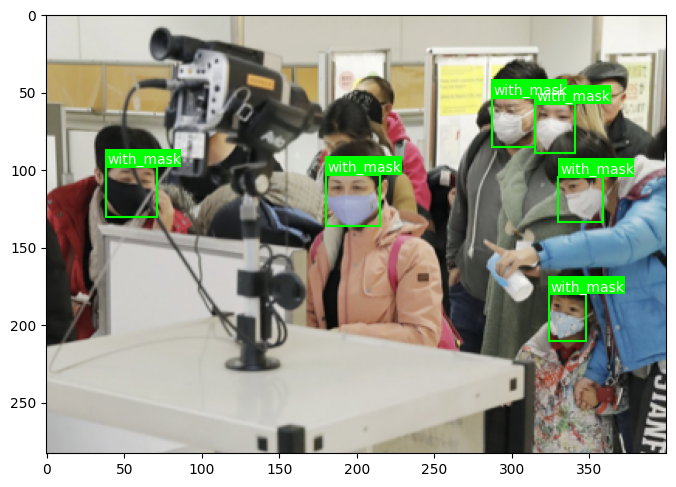

In [31]:
# Выберем рандомное фото и выведем его с рамками
img_name = np.random.choice(train_df.filename.unique())
print(img_name)

# Откроем файл с аннотацией и прочитаем содержимое
with open(
    os.path.join(
        TRAIN_LABELS_PATH,
        img_name.replace("png", "txt")
        )
    ) as f:
    txt_example = f.read()
# Выведем содержимое на экран
print(txt_example)

# Посмотрим на то, как выглядит сама картинка
plot_bounding_box(TRAIN_IMAGES_PATH, img_name)

Проверим, что количество аннотаций совпадает с количеством изображений:

In [32]:
# Проверим, что количество аннотаций совпадает с количество изображений в каждой выборке
print(len(os.listdir(TRAIN_LABELS_PATH)) == len(os.listdir(TRAIN_IMAGES_PATH)))
print(len(os.listdir(VAL_LABELS_PATH)) == len(os.listdir(VAL_IMAGES_PATH)))

True
True


## Строим модель детекции

Для сохранения процесса обучения воспользуемся инструментом Weights&Bias. Авторизуемся через анонимный аккаунт.

In [33]:
!pip install -q wandb --upgrade

import wandb
wandb.login(anonymous='must')

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.8/6.8 MB 25.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 24.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 289.6/289.6 kB 32.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 8.5 MB/s eta 0:00:00


<IPython.core.display.Javascript object>

wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

### Обучаем модель

Теперь мы можем воспользоваться модель и дообучить ее под нашу задачу.

In [1]:
# %%time

# Train the model
# model.train(
#     data="/content/dataset/dataset.yaml",
#     batch=-1, epochs=60, imgsz=512,
#     workers=os.cpu_count()
#     )

После обучения закомментим код, чтобы убрать ковер логов. Отметим лишь также, что на эпоху при обучении данной модели уходит лишь полминуты.

### Валидируем модель

Посмотрим на графики, наиболее общая информация, представляющая для нас интерес содержится в файле results.png.

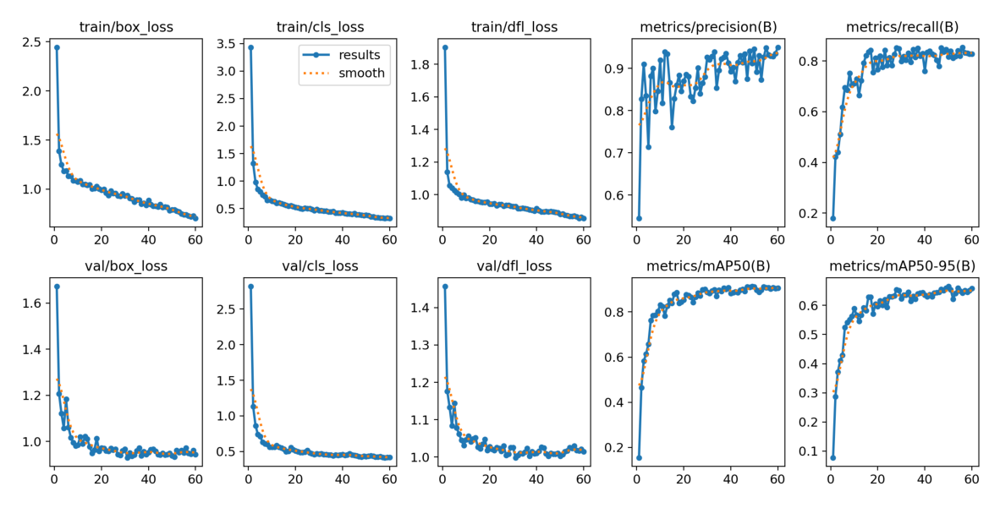

In [35]:
# Читаем файл с графиками процесса обучения
results = plt.imread('/content/runs/detect/train/results.png')
# Отображаем графики
fig, ax = plt.subplots(figsize=(15,12))
ax.axis('off')
ax.imshow(results);

В папке runs/detect/train/weights хранятся 2 файла с весами (параметрами нейронной сети):
* best.pt — файл, в котором сохранен лучший вариант параметров модели за все время обучения
* last.pt — файл, в котором сохранены веса, которые модель получила на последней эпохе обучения

In [39]:
os.listdir('/content/runs/detect/train/weights/')

['last.pt', 'best.pt']

Загрузим наилучшие веса в нашу модель и выведем метрики для валидационной выборки.


In [55]:
model = ultralytics.YOLO("/content/runs/detect/train/weights/best.pt")  # load a custom model

# Validate the model
results = model.val()  # no arguments needed, dataset and settings remembered
results.box.map  # map50-95
results.box.map50  # map50
results.box.map75  # map75
results.box.maps  # a list contains map50-95 of each category

Ultralytics YOLOv8.2.31 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25841497 parameters, 0 gradients, 78.7 GFLOPs


val: Scanning /content/dataset/labels/val.cache... 171 images, 0 backgrounds, 0 corrupt: 100%|██████████| 171/171 [00:00<?, ?it/s]
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:10<00:00,  1.08it/s]


                   all        171        696      0.913      0.843      0.911      0.664
 mask_weared_incorrect         18         20      0.862       0.85      0.888      0.685
             with_mask        154        534      0.939       0.92      0.955      0.703
          without_mask         59        142      0.939      0.759      0.889      0.605
Speed: 0.7ms preprocess, 14.3ms inference, 0.0ms loss, 13.4ms postprocess per image
Results saved to runs/detect/val2


array([    0.68503,     0.70331,     0.60472])

Проверим работу нашей лучшей модели, возьмем какую-нибудь картинку и подадим ее на вход модели.


image 1/1 /content/images/maksssksksss0.png: 384x512 1 with_mask, 2 without_masks, 113.4ms
Speed: 1.7ms preprocess, 113.4ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 512)


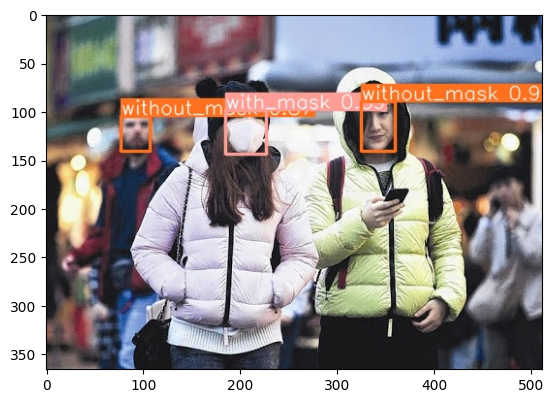

In [42]:
# Задаем путь до изображения
source = "/content/images/maksssksksss0.png"

results = model(source)  # получаем список результатов
# Сохраним результат в виде картинки
for i, r in enumerate(results):
    r.save(filename=f"results{i}.jpg")
# Визуализация
plt.imshow(plt.imread('/content/results0.jpg'));

maksssksksss11.png

image 1/1 /content/images/maksssksksss11.png: 352x512 1 mask_weared_incorrect, 18 with_masks, 20.7ms
Speed: 2.1ms preprocess, 20.7ms inference, 2.3ms postprocess per image at shape (1, 3, 352, 512)


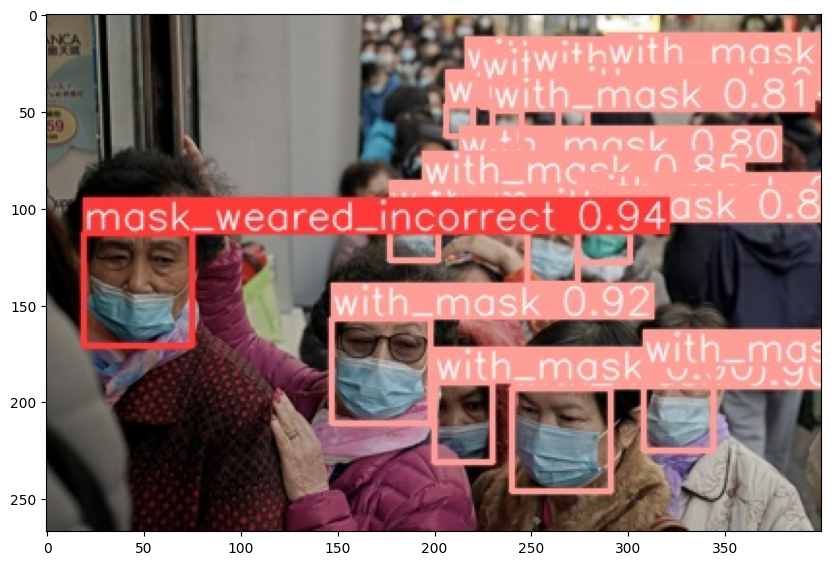

In [49]:
# Выберем рандомное фото и выведем его с рамками
random_image_idx = np.random.choice(valid_df.shape[0])
image_filename = xml_df.loc[random_image_idx, 'filename']
print(image_filename)
# Путь до изображения
image_path = os.path.join(IMAGES_PATH, image_filename)
# Пропускаем картинку через модель
prediction = model(image_path)
# Сохраним результат в виде картинки
for i, r in enumerate(prediction):
    r.save(filename=f"prediction{i}.jpg")
# Визуализация
fig, ax = plt.subplots(figsize=(10, 8))
plt.imshow(plt.imread('/content/prediction0.jpg'));

Займемся составлением таблицы предсказаний модели.

In [78]:
# filenames = valid_df['filename']
# # Создаем пустой список
# preds_lst = []
# # Создаем цикл по всем файлами
# for filename in tqdm(filenames):
#     # Составляем путь до изображения
#     image_path = os.path.join(IMAGES_PATH, filename)
#     # Пропускаем изображение через модель
#     prediction = model.predict(image_path)
#     # Конвертируем предсказания в список
#     pred_rows = prediction[0].boxes.data.tolist()
#     # Проходимся циклом по предсказаниям и заносим их в список
#     for i in range(len(pred_rows)):
#         pred_lst = []
#         pred_lst.append(filename)
#         pred_lst.extend(pred_rows[i])
#         preds_lst.append(pred_lst)

# Собираем таблиццу
columns = ['filename', 'xmin', 'ymin', 'xmax', 'ymax', 'confidence', 'class']
preds_df = pd.DataFrame(data=preds_lst, columns=columns)
preds_df.head()

,filename,xmin,ymin,xmax,ymax,confidence,class
0,maksssksksss655.png,106.622627,174.628998,208.055832,293.723907,0.922569,2.0
1,maksssksksss139.png,57.083656,133.261459,79.266426,160.635452,0.935283,0.0
2,maksssksksss139.png,345.336975,33.908821,371.546692,57.744102,0.893947,1.0
3,maksssksksss139.png,3.049144,177.124573,31.442154,209.438843,0.886317,1.0
4,maksssksksss139.png,97.059921,73.368271,117.023682,99.463669,0.884784,1.0


In [79]:
print('Исходное число изображений:              ', valid_df.filename.nunique())
print('Число изображений в таблице предсказаний:', preds_df.filename.nunique())
print('Число обнаруженных объектов:             ', preds_df.shape[0])

Исходное число изображений:               171
Число изображений в таблице предсказаний: 169
Число обнаруженных объектов:              6107


Число изображений в исходнике и в таблице предсказаний не сходится...

Это произошло потому, что порог уверенности модели оказался выше, чем требовалось для засчитывания предсказания:

In [80]:
print('Max confidence:', preds_df.confidence.max())
print('Min confidence:', preds_df.confidence.min())

Max confidence: 0.9527590274810791
Min confidence: 0.2521422803401947


Сохраним DataFrame с предсказанными координатами bounding box-ов, чтобы иметь возможность впоследствии проанализировать результаты.

In [81]:
#Сохраняем полученные предсказания в виде таблицы
preds_df.to_csv('/content/yolov8_preds_df.csv', index=False)

## Отчет модели

YOLOv8 хорош тем, что также при валидации самостоятельно сохраняет всю информацию в картинках:

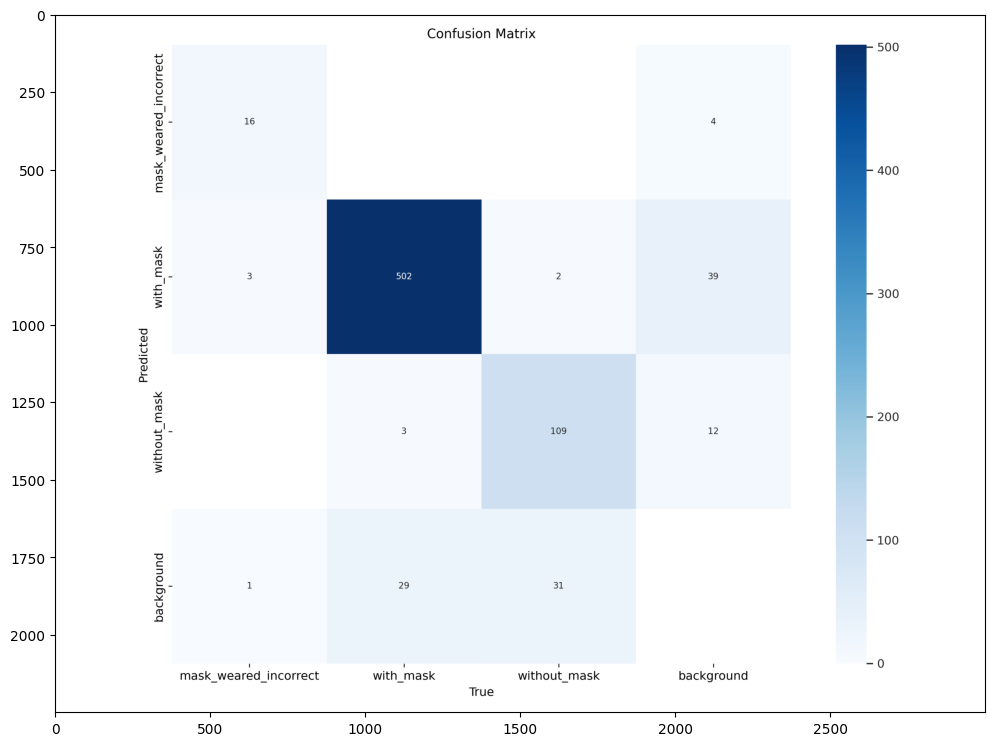

In [11]:
plt.subplots(figsize=(12, 12))
plt.imshow(plt.imread("yolov8_data/images/confusion_matrix.png"));

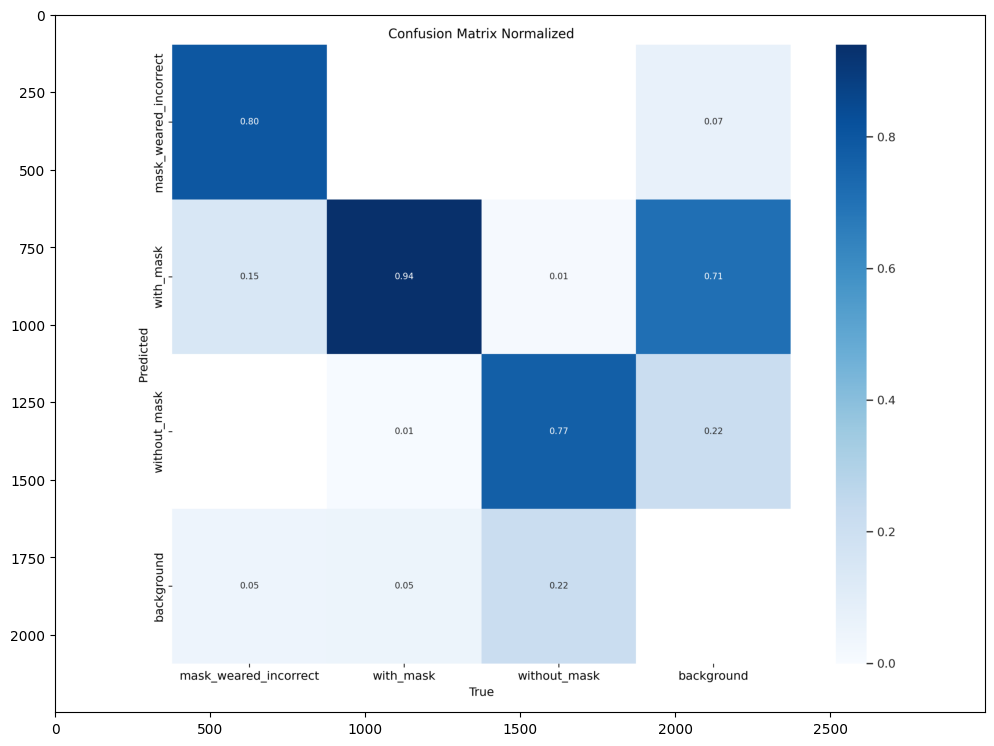

In [12]:
plt.subplots(figsize=(12, 12))
plt.imshow(plt.imread("yolov8_data/images/confusion_matrix_normalized.png"));

Здесь мы можем видеть, что модель находила объекты в фоне изображений и большую часть из них определила в класс `with_mask`. Также видим, что фон *поглотил* больше всего объектов класса `without_mask`.

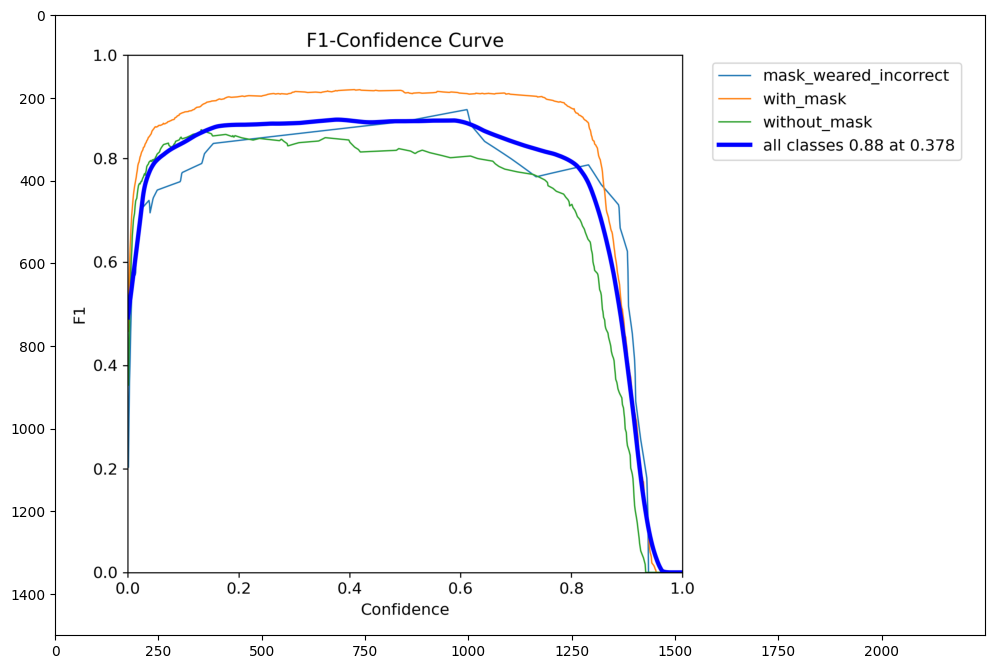

In [13]:
plt.subplots(figsize=(12, 12))
plt.imshow(plt.imread("yolov8_data/images/F1_curve.png"));

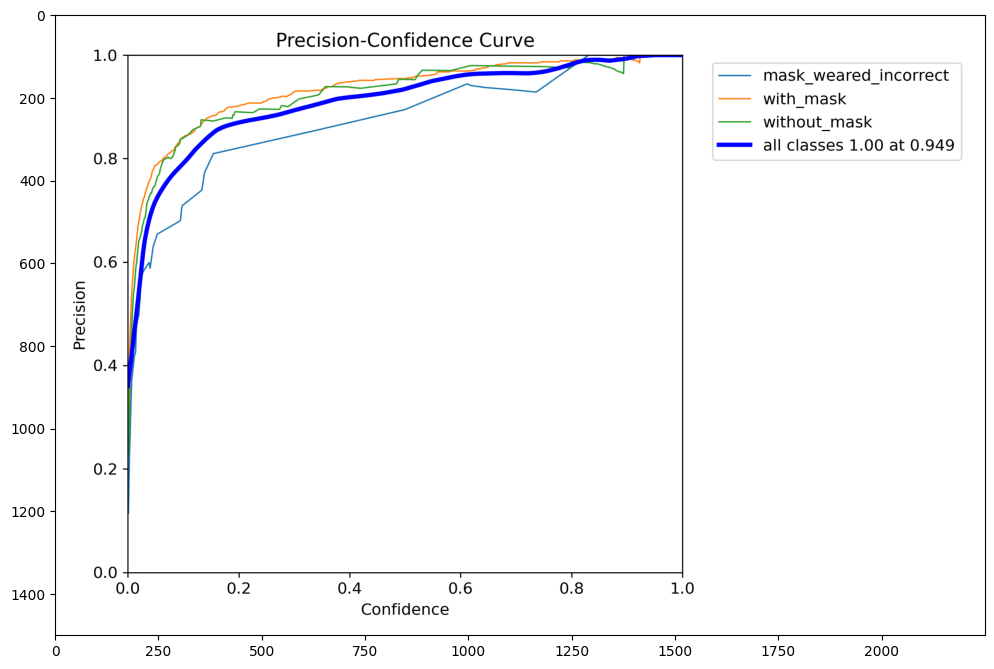

In [14]:
plt.subplots(figsize=(12, 12))
plt.imshow(plt.imread("yolov8_data/images/P_curve.png"));

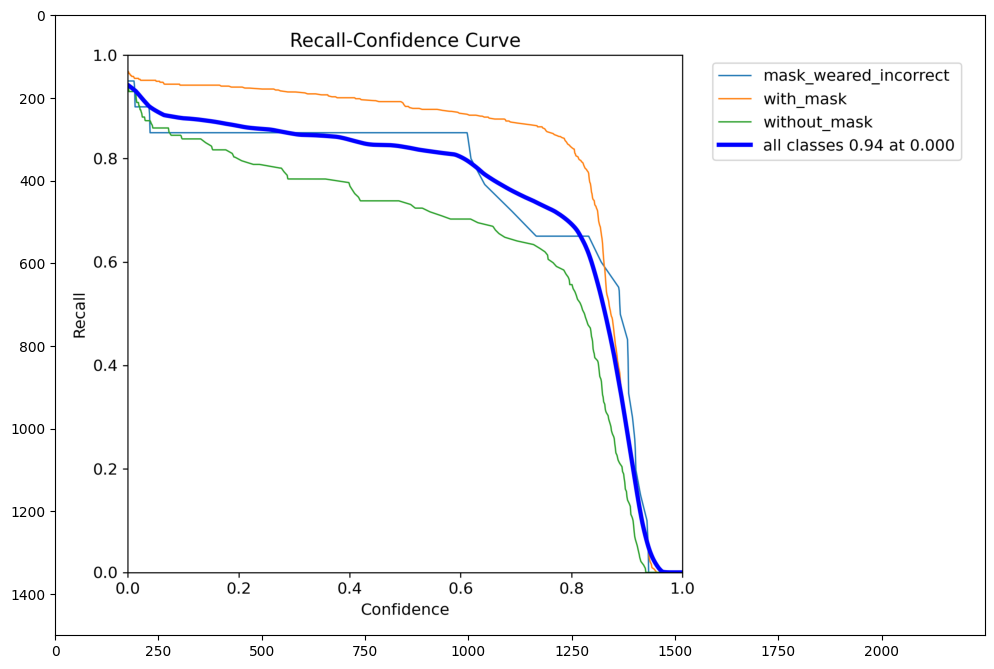

In [16]:
plt.subplots(figsize=(12, 12))
plt.imshow(plt.imread("yolov8_data/images/R_curve.png"));

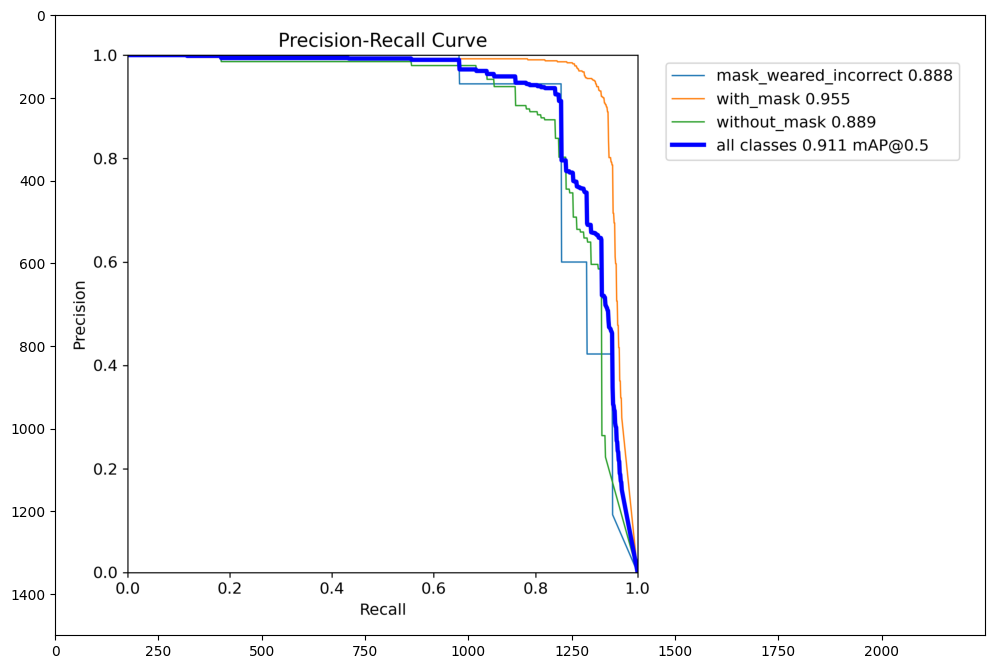

In [15]:
plt.subplots(figsize=(12, 12))
plt.imshow(plt.imread("yolov8_data/images/PR_curve.png"));

Довольно хороший результат.

Ну и визуализация батчей:

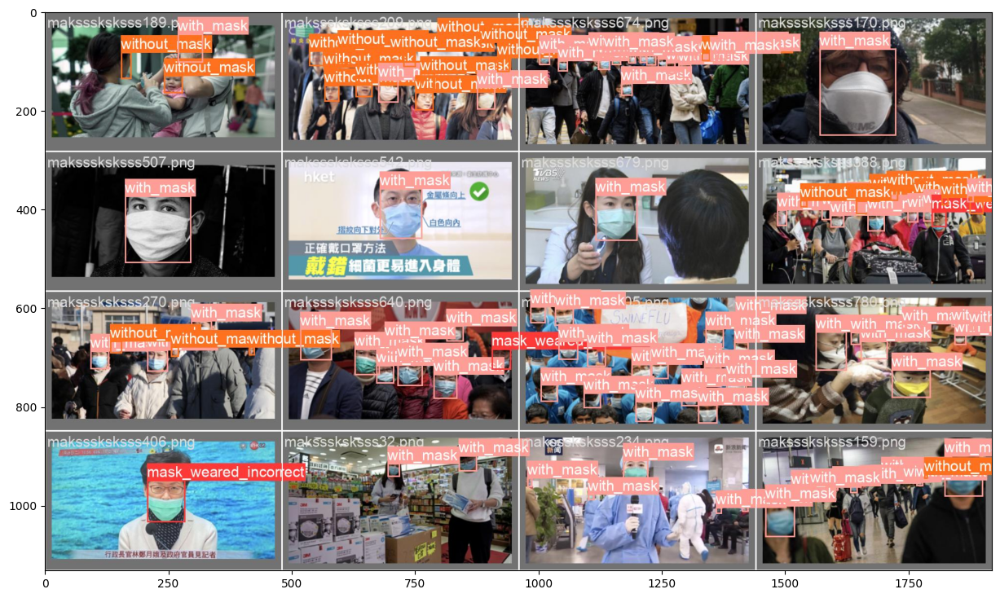

In [22]:
plt.subplots(figsize=(15, 15))
plt.imshow(plt.imread("yolov8_data/images/val_batch0_labels.jpg"));

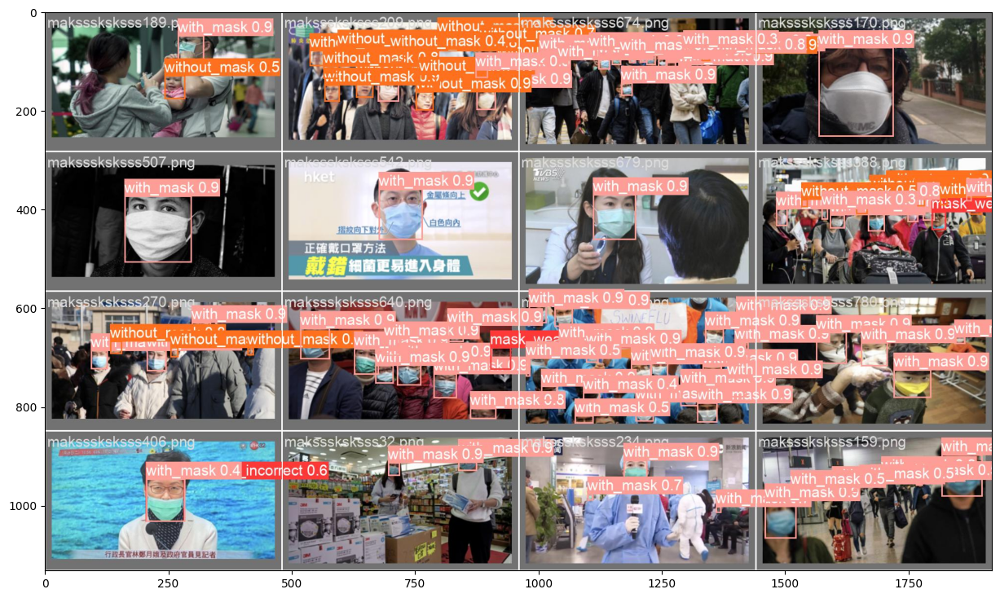

In [23]:
plt.subplots(figsize=(15, 15))
plt.imshow(plt.imread("yolov8_data/images/val_batch0_pred.jpg"));

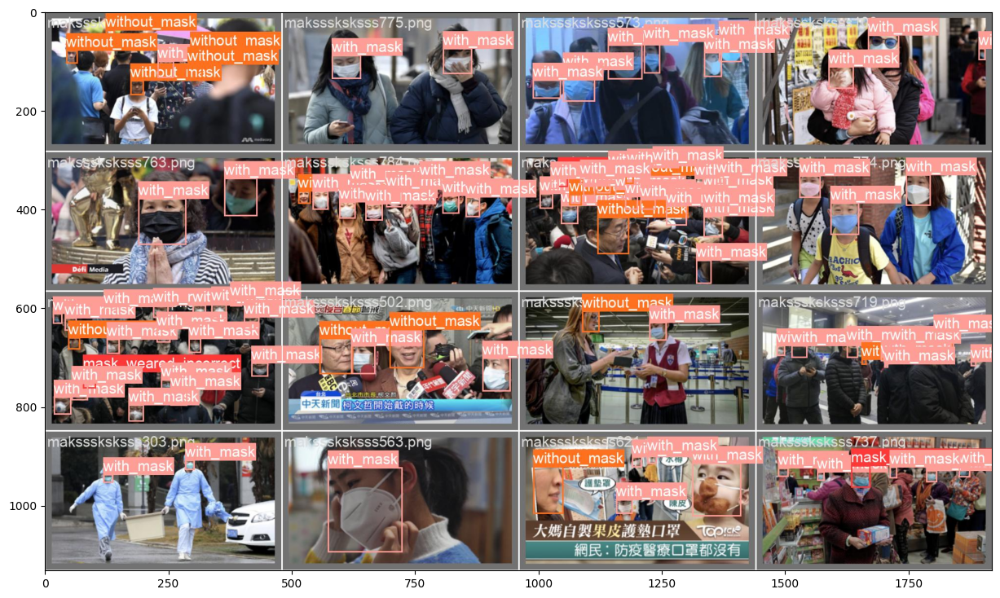

In [24]:
plt.subplots(figsize=(15, 15))
plt.imshow(plt.imread("yolov8_data/images/val_batch1_labels.jpg"));

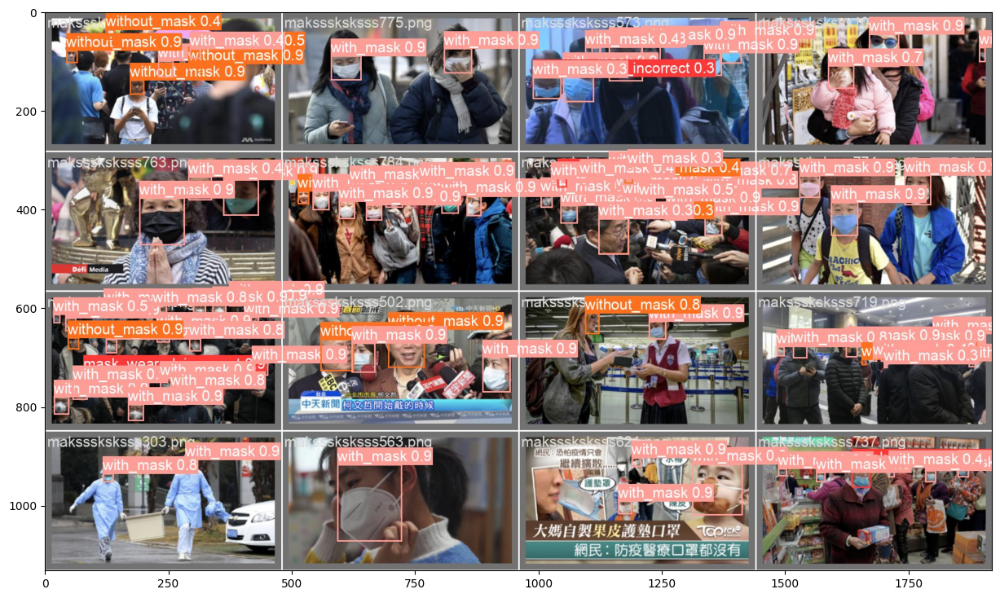

In [25]:
plt.subplots(figsize=(15, 15))
plt.imshow(plt.imread("yolov8_data/images/val_batch1_pred.jpg"));

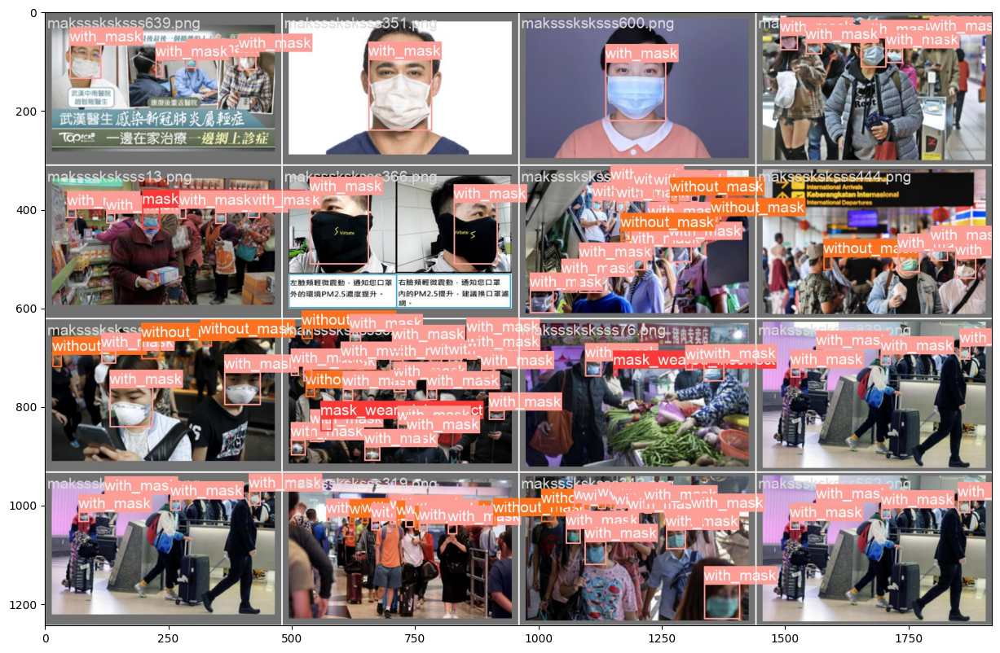

In [26]:
plt.subplots(figsize=(15, 15))
plt.imshow(plt.imread("yolov8_data/images/val_batch2_labels.jpg"));

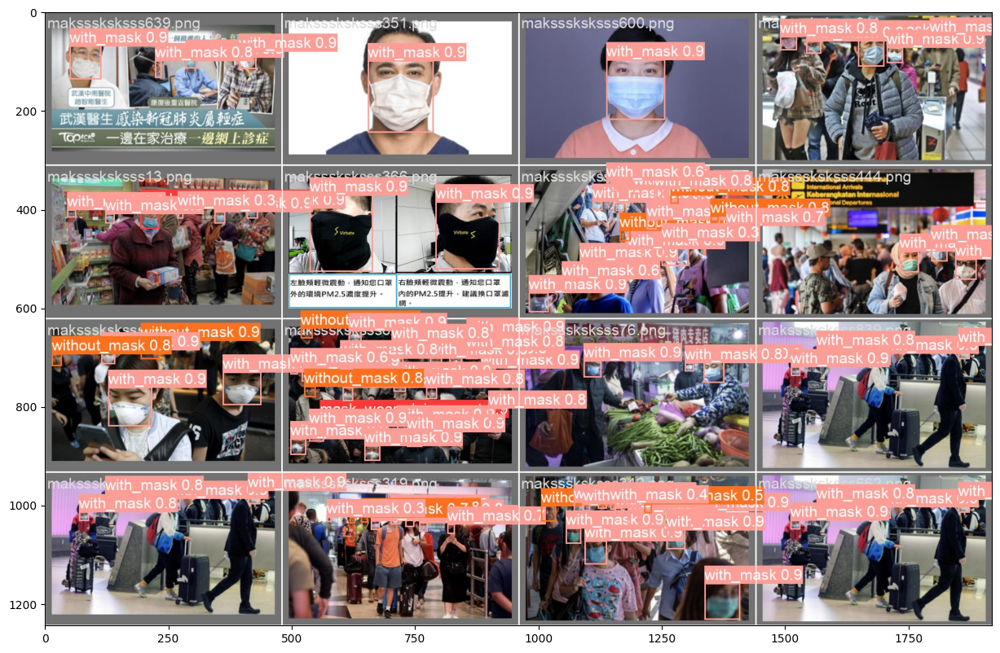

In [27]:
plt.subplots(figsize=(15, 15))
plt.imshow(plt.imread("yolov8_data/images/val_batch2_pred.jpg"));